In [3]:
import numpy as np 
import pandas as pd 
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import itertools

from prophet import Prophet  # for forecasting
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.diagnostics import cross_validation, performance_metrics

C:\Users\SONY VAIO\.conda\envs\SIC\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
df_train = pd.read_csv('../dataset_weather_daily/Dataset_weather_daily.csv')
df_train.tail() 

,Date,Temp,Humidity,Windspeed,Pressure
1457,12/28/2016,17.217391,68.043478,3.547826,1015.565217
1458,12/29/2016,15.238095,87.857143,6.000000,1016.904762
1459,12/30/2016,14.095238,89.666667,6.266667,1017.904762
1460,12/31/2016,15.052632,87.000000,7.325000,1016.100000
1461,1/1/2017,10.000000,100.000000,0.000000,1016.000000


In [5]:
df_train.head() 

,Date,Temp,Humidity,Windspeed,Pressure
0,1/1/2013,10.000000,84.500000,0.000000,1015.666667
1,1/2/2013,7.400000,92.000000,2.980000,1017.800000
2,1/3/2013,7.166667,87.000000,4.633333,1018.666667
3,1/4/2013,8.666667,71.333333,1.233333,1017.166667
4,1/5/2013,6.000000,86.833333,3.700000,1016.500000


In [6]:
print(f"Phạm vi thời gian: {df_train['Date'].min()} đến {df_train['Date'].max()}") 

Phạm vi thời gian: 1/1/2013 đến 9/9/2016


In [7]:
# Chuyển cột 'Date' sang định dạng datetime
df_train['Date'] = pd.to_datetime(df_train['Date'])

<Axes: title={'center': 'Quan sát trên từng tháng'}, xlabel='month'>

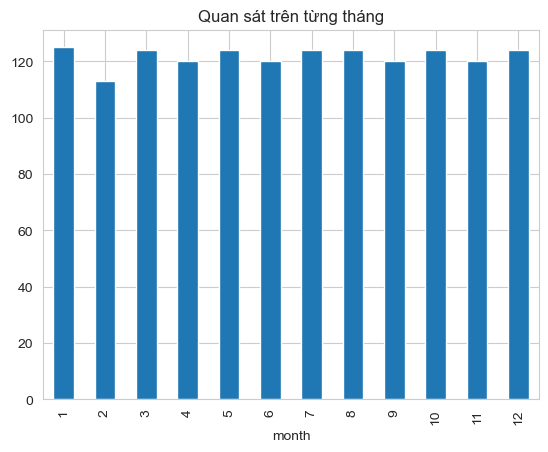

In [8]:
# Tạo histogram hoặc đếm số lượng quan sát theo ngày, tháng, hoặc năm
# Tạo cột 'month' và 'year'
df_train['month'] = df_train['Date'].dt.month
df_train['year'] = df_train['Date'].dt.year

# Tạo biểu đồ đếm số lượng quan sát theo tháng
df_train['month'].value_counts().sort_index().plot(kind='bar', title='Quan sát trên từng tháng')


In [9]:
# Thống kê mô tả cơ bản: Sử dụng hàm describe để tính toán trung bình, độ lệch chuẩn, min, max:
print(df_train[['Temp', 'Humidity', 'Windspeed', 'Pressure']].describe())


              Temp     Humidity    Windspeed     Pressure
count  1462.000000  1462.000000  1462.000000  1462.000000
mean     25.495521    60.771702     6.802209  1011.104548
std       7.348103    16.769652     4.561602   180.231668
min       6.000000    13.428571     0.000000    -3.041667
25%      18.857143    50.375000     3.475000  1001.580357
50%      27.714286    62.625000     6.221667  1008.563492
75%      31.305804    72.218750     9.238235  1014.944901
max      38.714286   100.000000    42.220000  7679.333333


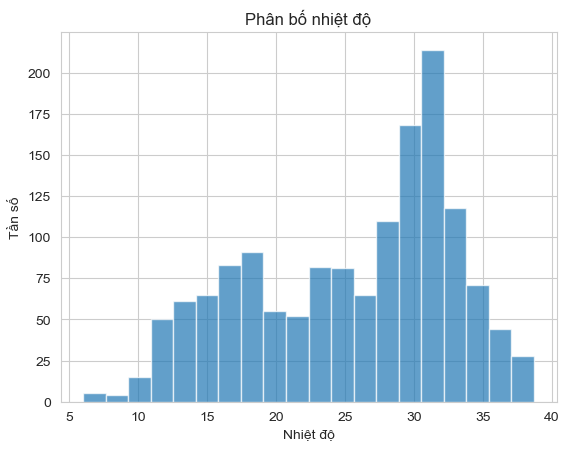

In [10]:
#Biểu đồ histogram để xem dạng phân phối (chuông, lệch phải, lệch trái,...)
import matplotlib.pyplot as plt
df_train['Temp'].hist(bins=20, alpha=0.7)
plt.title('Phân bố nhiệt độ')  # Đặt tiêu đề biểu đồ
plt.xlabel('Nhiệt độ')  # Nhãn trục x 
plt.ylabel('Tần số')    # Nhãn trục y 
plt.show()

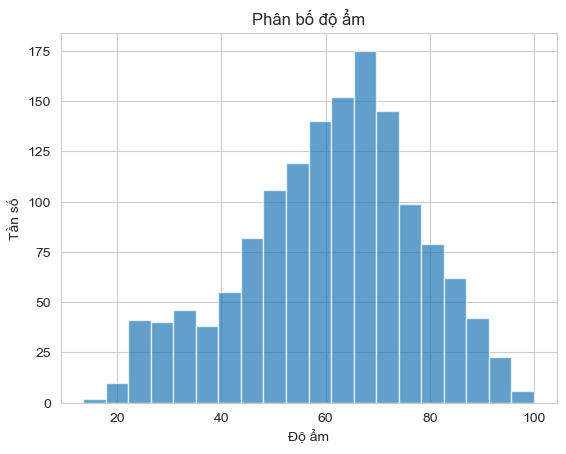

In [11]:
import matplotlib.pyplot as plt
df_train['Humidity'].hist(bins=20, alpha=0.7)
plt.title('Phân bố độ ẩm')  # Đặt tiêu đề biểu đồ
plt.xlabel('Độ ẩm')  # Nhãn trục x 
plt.ylabel('Tần số')    # Nhãn trục y 
plt.show()

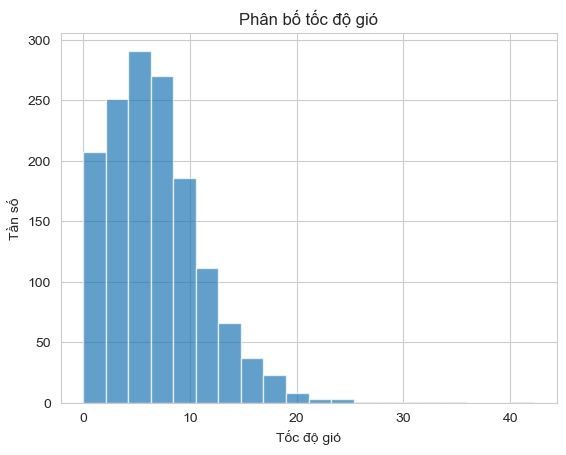

In [12]:
import matplotlib.pyplot as plt
df_train['Windspeed'].hist(bins=20, alpha=0.7)
plt.title('Phân bố tốc độ gió')  # Đặt tiêu đề biểu đồ
plt.xlabel('Tốc độ gió')  # Nhãn trục x 
plt.ylabel('Tần số')    # Nhãn trục y 
plt.show()

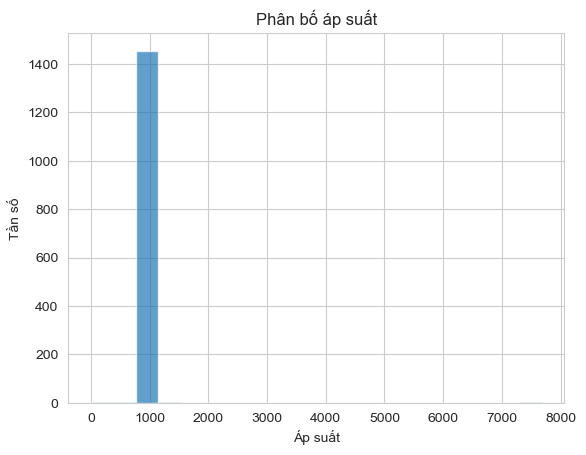

In [13]:
import matplotlib.pyplot as plt
df_train['Pressure'].hist(bins=20, alpha=0.7)
plt.title('Phân bố áp suất')  # Đặt tiêu đề biểu đồ
plt.xlabel('Áp suất')  # Nhãn trục x 
plt.ylabel('Tần số')    # Nhãn trục y 
plt.show()

<Axes: xlabel='Humidity'>

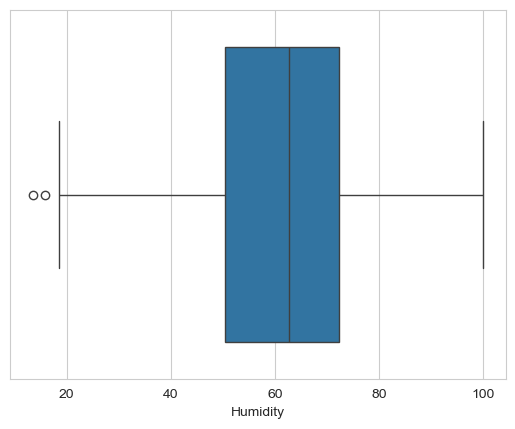

In [14]:
# Xác định giá trị ngoại lệ (outliers):
# Dùng boxplot:
import seaborn as sns
sns.boxplot(x=df_train['Humidity'])


<Axes: xlabel='Temp'>

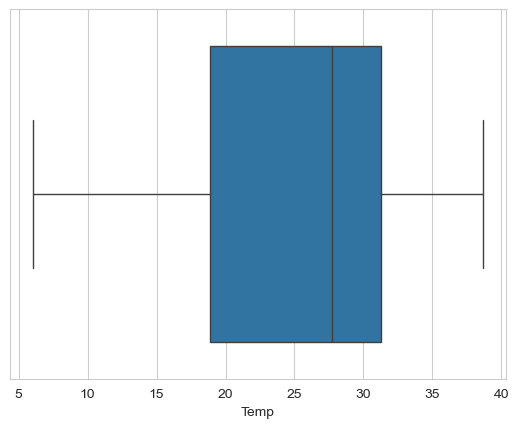

In [15]:

import seaborn as sns
sns.boxplot(x=df_train['Temp'])


<Axes: xlabel='Pressure'>

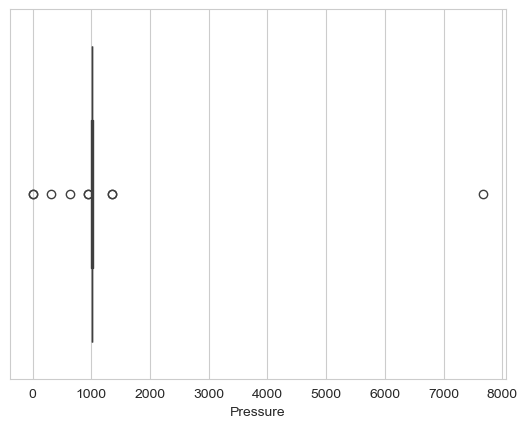

In [16]:
import seaborn as sns
sns.boxplot(x=df_train['Pressure'])


<Axes: xlabel='Windspeed'>

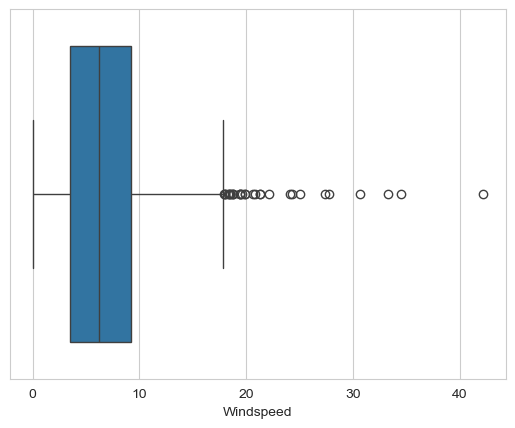

In [17]:
import seaborn as sns
sns.boxplot(x=df_train['Windspeed'])


In [18]:
figure=px.line(df_train,x="Date",y="Temp",title="Nhiệt độ trung bình trong những năm qua")
figure.show()

In [19]:
figure=px.line(df_train,x="Date",y="Humidity",title="Độ ẩm trung bình trong những năm qua")
figure.show()

In [20]:
figure=px.line(df_train,x="Date",y="Windspeed",title="Tốc độ gió trung bình trong những năm qua")
figure.show()

In [21]:
figure=px.line(df_train,x="Date",y="Pressure",title="Áp suất trung bình trong những năm qua")
figure.show()

In [33]:
# Phân tích cộng tính cho nhiệt độ trung bình
# Thực hiện phân rã chuỗi thời gian
df_train["Date"] = pd.to_datetime(df_train["Date"])
decomp = sm.tsa.seasonal_decompose(df_train.set_index("Date")["Temp"], period=365)
df_decomp = pd.concat([decomp.trend, decomp.seasonal, decomp.resid], axis=1)
df_decomp_clean = df_decomp.dropna()
print(df_decomp_clean.head())

                trend  seasonal     resid
Date                                     
2013-07-02  24.791494  6.600322  1.751041
2013-07-03  24.800740  4.929004  1.841684
2013-07-04  24.810603  6.328463  1.235933
2013-07-05  24.825215  9.401699 -1.426914
2013-07-06  24.836745  4.821841  1.341415


In [27]:
fig = px.line(df_decomp, y="trend", title="Trend")
fig.show()

In [28]:
fig = px.line(df_decomp, y="seasonal", title="Seasonality")
fig.show()

In [29]:
fig = px.line(df_decomp, y="resid", title="Residuals")
fig.show()

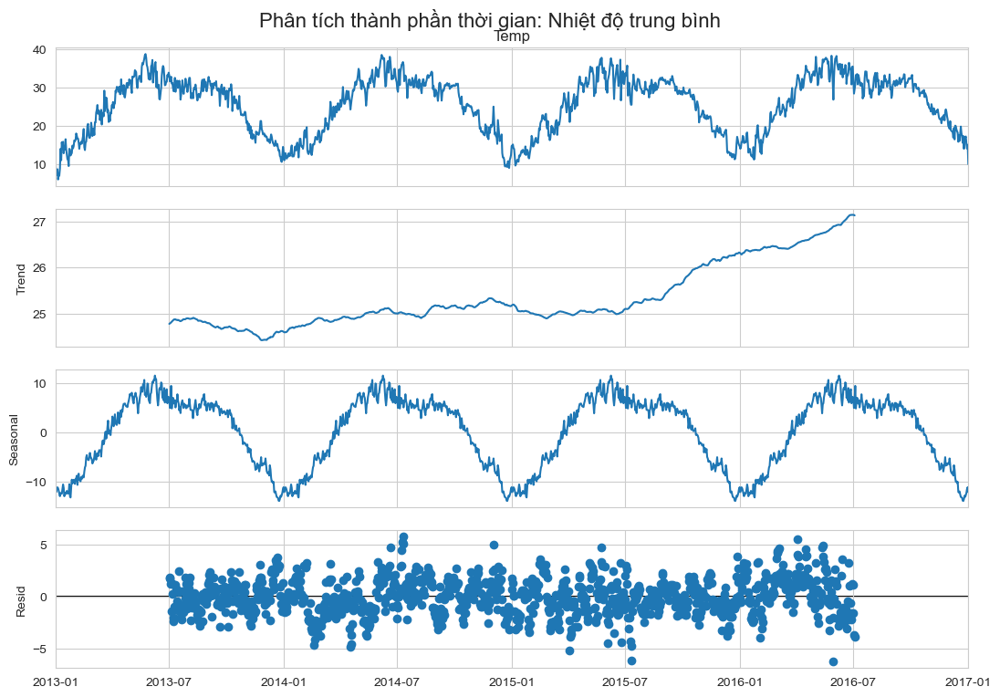

,Trend,Seasonal,Residual
Date,,,
2013-01-01,NaN,-11.112191,NaN
2013-01-02,NaN,-12.097390,NaN
2013-01-03,NaN,-11.386488,NaN
2013-01-04,NaN,-11.134559,NaN
2013-01-05,NaN,-11.317170,NaN


In [34]:
# Tạo dataframe từ các thành phần
df_decomp.columns = ['Trend', 'Seasonal', 'Residual']

# Trực quan hóa các thành phần
fig = decomp.plot()
fig.set_size_inches(12, 8)
plt.suptitle("Phân tích thành phần thời gian: Nhiệt độ trung bình", fontsize=16)
plt.show()

# Hiển thị một số giá trị đầu của dataframe phân tích
df_decomp.head()

In [35]:
df_prophet = df_train.rename(columns={'Date': 'ds', 'Temp': 'y'})

m_bsl = Prophet(holidays_prior_scale=False)
m_bsl.fit(df_prophet)
future = m_bsl.make_future_dataframe(periods=365)
forecast_bsl = m_bsl.predict(future)

fig1 = plot_plotly(m_bsl, forecast_bsl, changepoints=True, changepoints_threshold=0.05)
fig1.show()

fig2 = plot_components_plotly(m_bsl, forecast_bsl)
fig2.show()

23:53:36 - cmdstanpy - INFO - Chain [1] start processing
23:53:39 - cmdstanpy - INFO - Chain [1] done processing


In [36]:
x1 = np.random.laplace(0, 0.05, 10000)
x2 = np.random.laplace(0, 0.01, 10000)
x3 = np.random.laplace(0, 0.1, 10000)

hist_data = [x1, x2, x3]
group_labels = ['τ = 0.05', 'τ = 0.01', 'τ = 0.1']

fig = ff.create_distplot(hist_data, group_labels, bin_size=0.001, show_rug=False)
fig.update_layout(title_text='Phân phối Laplace với τ thay đổi')
fig.show()

In [37]:
x1 = np.random.normal(0, 0.05, 10000)
x2 = np.random.normal(0, 0.01, 10000)
x3 = np.random.normal(0, 0.1, 10000)

hist_data = [x1, x2, x3]
group_labels = ['σ = 0.05', 'σ = 0.01', 'σ = 0.1']

fig = ff.create_distplot(hist_data, group_labels, bin_size=0.001, show_rug=False)
fig.update_layout(title_text='Phân phối Gaussian với σ thay đổi')
fig.show()

In [38]:
# Định nghĩa khoảng thời gian dự báo
horizon = '90 days'

# Tạo danh sách các ngày cắt (cutoffs)
cutoffs = pd.to_datetime(['2016-01-01', '2016-05-01', '2016-09-01'])

# Kiểm tra chéo (cross-validation) với Prophet
df_cv_bsl = cross_validation(m_bsl, cutoffs=cutoffs, horizon=horizon)

  0%|          | 0/3 [00:00<?, ?it/s]00:46:19 - cmdstanpy - INFO - Chain [1] start processing
00:46:19 - cmdstanpy - INFO - Chain [1] done processing
 33%|███▎      | 1/3 [00:03<00:06,  3.35s/it]00:46:20 - cmdstanpy - INFO - Chain [1] start processing
00:46:20 - cmdstanpy - INFO - Chain [1] done processing
 67%|██████▋   | 2/3 [00:04<00:02,  2.03s/it]00:46:21 - cmdstanpy - INFO - Chain [1] start processing
00:46:21 - cmdstanpy - INFO - Chain [1] done processing
100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


In [39]:
param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1],
    'seasonality_prior_scale': [0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df_prophet)  # Fit model with given params
    df_cv = cross_validation(m, cutoffs=cutoffs, horizon=horizon, parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
best_params = all_params[np.argmin(rmses)]
print(best_params)

00:47:53 - cmdstanpy - INFO - Chain [1] start processing
00:47:53 - cmdstanpy - INFO - Chain [1] done processing
00:47:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:47:53 - cmdstanpy - INFO - Chain [1] start processing
00:48:01 - cmdstanpy - INFO - Chain [1] done processing
00:48:11 - cmdstanpy - INFO - Chain [1] start processing
00:48:12 - cmdstanpy - INFO - Chain [1] done processing
00:48:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:48:12 - cmdstanpy - INFO - Chain [1] start processing
00:48:20 - cmdstanpy - INFO - Chain [1] done processing
00:48:29 - cmdstanpy - INFO - Chain [1] start processing
00:48:29 - cmdstanpy - INFO - Chain [1] done processing
00:48:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abn

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0}


In [40]:
m_tuned = Prophet(changepoint_prior_scale=0.001, seasonality_prior_scale=10.0, holidays_prior_scale=False)
m_tuned.fit(df_prophet)
future = m_tuned.make_future_dataframe(periods=365)
forecast_tuned = m_tuned.predict(future)

fig1 = plot_plotly(m_tuned, forecast_tuned, changepoints=True, changepoints_threshold=0.001)
fig1.show()

fig2 = plot_components_plotly(m_tuned, forecast_tuned)
fig2.show()

00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:38 - cmdstanpy - INFO - Chain [1] done processing
00:51:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:46 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
df_cv_tuned = cross_validation(m_tuned, cutoffs=cutoffs, horizon=horizon)

df_results = df_cv_bsl[['ds', 'y']]
df_results['yhat_bsl'] = df_cv_bsl['yhat']
df_results['yhat_tuned'] = df_cv_tuned['yhat']
df_results['err_bsl'] = np.abs(df_results['y'] - df_results['yhat_bsl'])/df_results['y']
df_results['err_tuned'] = np.abs(df_results['y'] - df_results['yhat_tuned'])/df_results['y']
df_results['err_diff'] = df_results['err_bsl'] - df_results['err_tuned']

df_results = df_results.iloc[:365]  # just get results from first horizon

fig = px.bar(df_results, x="ds", y="err_diff", title='Error difference (values > 0 favor tuned model)', labels={'err_diff': 'Baseline - tuned model error'})
fig.show()

  0%|          | 0/3 [00:00<?, ?it/s]00:53:47 - cmdstanpy - INFO - Chain [1] start processing
00:53:47 - cmdstanpy - INFO - Chain [1] done processing
00:53:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:53:48 - cmdstanpy - INFO - Chain [1] start processing
00:53:52 - cmdstanpy - INFO - Chain [1] done processing
 33%|███▎      | 1/3 [00:05<00:10,  5.16s/it]00:53:52 - cmdstanpy - INFO - Chain [1] start processing
00:53:52 - cmdstanpy - INFO - Chain [1] done processing
 67%|██████▋   | 2/3 [00:05<00:02,  2.61s/it]00:53:53 - cmdstanpy - INFO - Chain [1] start processing
00:53:53 - cmdstanpy - INFO - Chain [1] done processing
100%|██████████| 3/3 [00:06<00:00,  2.29s/it]


In [46]:
# Định nghĩa test_period dựa trên số ngày trong tập dữ liệu kiểm tra
df_test = pd.read_csv('../dataset_weather_daily/DailyDelhiClimateTest.csv')
test_period = len(df_test)

# Tạo dataframe tương lai để dự báo
future = m_bsl.make_future_dataframe(periods=test_period)

# Dự báo với mô hình gốc và mô hình tinh chỉnh
forecast_bsl = m_bsl.predict(future)
forecast_tuned = m_tuned.predict(future)

# Lấy giá trị thực tế và giá trị dự báo
y_true = df_test['Temp']  # Nhiệt độ thực tế
y_pred_bsl = forecast_bsl['yhat'].tail(test_period)  # Dự báo từ mô hình gốc
y_pred_tuned = forecast_tuned['yhat'].tail(test_period)  # Dự báo từ mô hình tinh chỉnh

In [47]:
from sklearn.metrics import mean_absolute_percentage_error

mape_bsl = mean_absolute_percentage_error(y_true, y_pred_bsl)
mape_tuned = mean_absolute_percentage_error(y_true, y_pred_tuned)
diff = mape_bsl - mape_tuned

mape_bsl = np.round(mape_bsl*100, 1)
mape_tuned = np.round(mape_tuned*100, 1)
diff = np.round(diff*100, 1)

print(f"Baseline MAPE: {mape_bsl}%, tuned MAPE: {mape_tuned}%, difference: {diff}%")

Baseline MAPE: 12.0%, tuned MAPE: 10.8%, difference: 1.2%
